# Building model for Birds Species Classification

In [1]:
import numpy as np
import pandas as pd
import os
import glob
import pathlib


for dirname, _, filenames in os.walk('birds/input'):
    for filename in filenames:
        pass
        #print(os.path.join(dirname, filename))

In [2]:
import torch
import numpy as np


train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')

CUDA is available!  Training on GPU ...


In [3]:
import pickle
import numpy as np
import random
from skimage import io

from tqdm import tqdm, tqdm_notebook
from PIL import Image
from pathlib import Path

from torchvision import transforms
from multiprocessing.pool import ThreadPool
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn

from matplotlib import colors, pyplot as plt
import seaborn as sns
%matplotlib inline


import warnings
warnings.filterwarnings(action='ignore', category=DeprecationWarning)

In [ ]:
folders = ["train", "valid", "test"]
for folder in folders:
    for file in pathlib.Path(f"birds/input/{folder}").glob("*/*.jpg"):
        path = os.path.dirname(file)
        basename_dir = os.path.basename(path)
        basename_file = os.path.basename(file)
        dst = f"{basename_dir}.{basename_file}"
        os.rename(file, os.path.join(path, dst))

In [4]:
SEED = 1937

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

In [5]:
# разные режимы датасета 
DATA_MODES = ['train', 'val', 'test']
# все изображения будут масштабированы к размеру 224x224 px
RESCALE_SIZE = 232
# работаем на видеокарте
DEVICE = torch.device("cuda")

In [6]:
class BirdsDataset(Dataset):
    """
    Датасет с картинками, который паралельно подгружает их из папок
    производит скалирование и превращение в тензоры
    """
    def __init__(self, files, mode):
        super().__init__()
        # file list for loading
        self.files = sorted(files)
        # режим работы
        self.mode = mode

        if self.mode not in DATA_MODES:
            print(f"{self.mode} is not correct; correct modes: {DATA_MODES}")
            raise NameError

        self.len_ = len(self.files)
     
        self.label_encoder = LabelEncoder()

        # if self.mode != 'test':
        self.labels = [path.parent.name for path in self.files]
        self.label_encoder.fit(self.labels)

        with open('label_encoder.pkl', 'wb') as le_dump_file:
              pickle.dump(self.label_encoder, le_dump_file)

    def __len__(self):
        return self.len_
      
    def load_sample(self, file):
        image = Image.open(file)
        image.load()
        return image
  
    def __getitem__(self, index, normalize=True):
        # для преобразования изображений в тензоры PyTorch и нормализации входа
        if self.mode == 'train': 
            transform = transforms.Compose([
                transforms.Resize(size=(232,232)),
                transforms.CenterCrop(size=224),
                transforms.RandomRotation(degrees=60),
                transforms.RandomHorizontalFlip(),
                transforms.RandomVerticalFlip(p=0.1),
                transforms.RandomGrayscale(p=0.1),
                transforms.ColorJitter(hue=.1, saturation=.1),
                transforms.ToTensor(),
                transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) 
            ])
        else:
            transform = transforms.Compose([
                transforms.Resize(size=(232,232)),
                transforms.CenterCrop(size=224),
                transforms.ToTensor(),
                transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) 
            ])
            
        self._transforms_for_plot = transforms.Compose([
                                  transforms.Resize(size=(RESCALE_SIZE,RESCALE_SIZE)),
                                  transforms.ToTensor()
                                  ])
        
        x = self.load_sample(self.files[index])
        
        if normalize:
            x = transform(x)
        else:
            x = self._transforms_for_plot(x)
        
        label = self.labels[index]
        label_id = self.label_encoder.transform([label])
        y = label_id.item()
        return x, y

In [7]:
TRAIN_DIR = Path("birds/input/train")
VALID_DIR = Path("birds/input/valid")
TEST_DIR = Path("birds/input/test")

train_files = sorted(list(TRAIN_DIR.rglob('*/*.jpg')))
valid_files = sorted(list(VALID_DIR.rglob('*/*.jpg')))
test_files = sorted(list(TEST_DIR.rglob('*/*.jpg')))

In [8]:
train_dataset = BirdsDataset(train_files, mode='train')
val_dataset = BirdsDataset(valid_files, mode='val')
test_dataset = BirdsDataset(test_files, mode='test')

/root/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


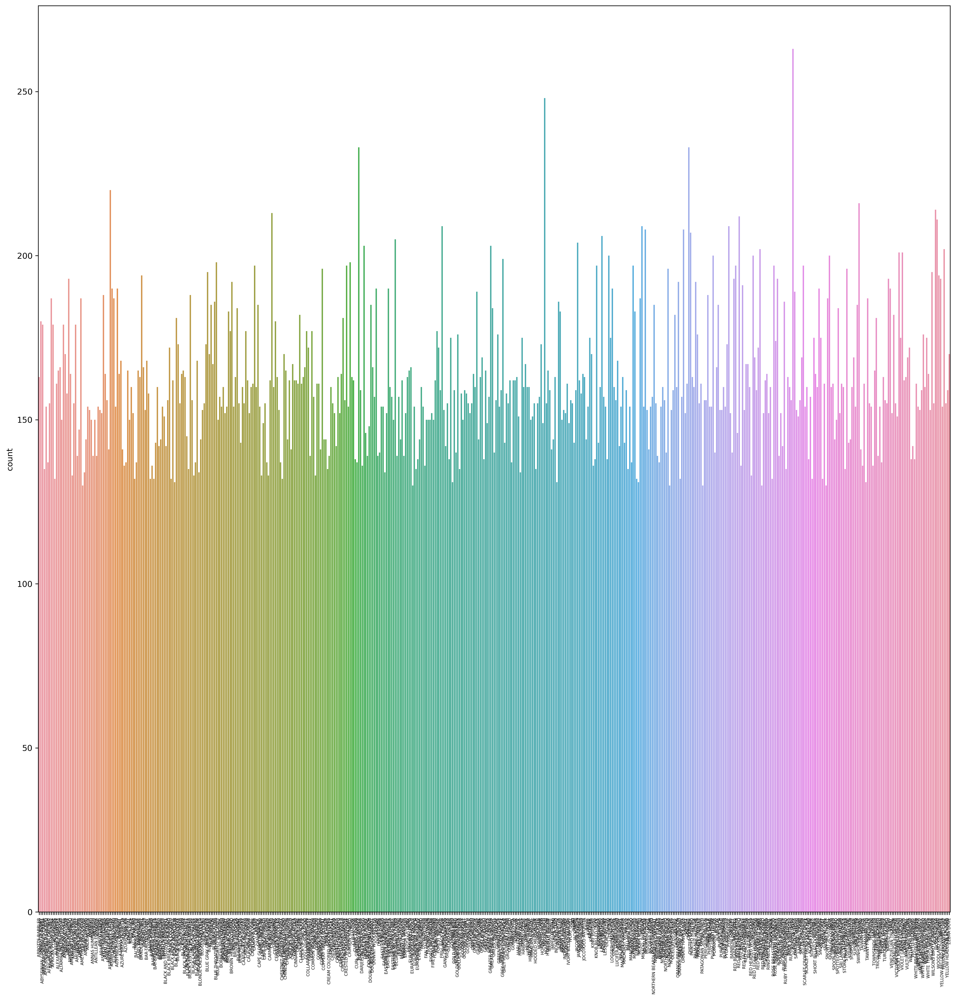

In [9]:
fig, ax = plt.subplots(figsize=(20, 20), dpi=300)

sns.countplot(train_dataset.labels, ax=ax)
ax.tick_params(axis='x', labelrotation=90, labelsize=5);

In [10]:
a = np.unique(train_dataset.labels, return_counts=True)
np.argmin(a[1])
a[0][25]

'AMETHYST WOODSTAR'

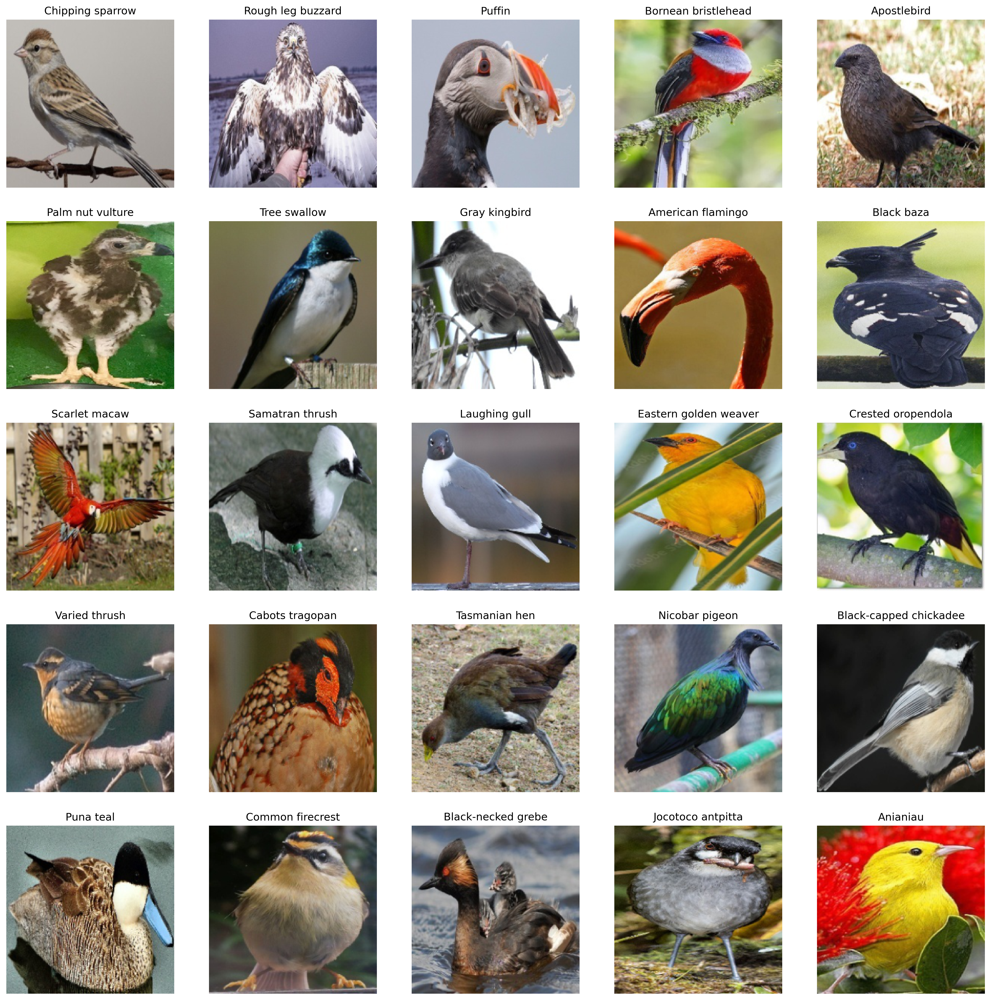

In [11]:
from random import randrange


fig, ax = plt.subplots(nrows=5, ncols=5,figsize=(20, 20), dpi=300)

labels, index = np.unique(train_dataset.labels, return_index=True)
for fig_x in ax.flatten():
    random_class = list(index).pop(randrange(len(index)))
    im_val = train_dataset.__getitem__(random_class, normalize=False)[0].permute(1, 2, 0)
    label = train_dataset.__getitem__(random_class, normalize=False)[1]
    
    img_label = " ".join(map(lambda x: x.capitalize(),
                train_dataset.label_encoder.inverse_transform([label])[0].split('_')))
    fig_x.imshow(im_val.data.cpu())
    fig_x.set_title(img_label)
    fig_x.set_axis_off()

In [12]:
def fit_epoch(model, train_loader, criterion, optimizer):
    running_loss = 0.0
    running_corrects = 0
    processed_data = 0
  
    for inputs, labels in train_loader:
        inputs = inputs.to(DEVICE)
        labels = labels.to(DEVICE)
        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        preds = torch.argmax(outputs, 1)
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)
        processed_data += inputs.size(0)
              
    train_loss = running_loss / processed_data
    train_acc = running_corrects.cpu().numpy() / processed_data
    return train_loss, train_acc

In [13]:
def eval_epoch(model, val_loader, criterion):
    model.eval()
    running_loss = 0.0
    running_corrects = 0
    processed_size = 0

    for inputs, labels in val_loader:
        inputs = inputs.to(DEVICE)
        labels = labels.to(DEVICE)

        with torch.set_grad_enabled(False):
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            preds = torch.argmax(outputs, 1)

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)
        processed_size += inputs.size(0)
    val_loss = running_loss / processed_size
    val_acc = running_corrects.double() / processed_size
    return val_loss, val_acc

In [15]:
def train(train_dataset, val_dataset, model, epochs, batch_size, shuffle=True, sampler=None):
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=shuffle, sampler=sampler, num_workers=8)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    lr = 1e-3
    history = []
    log_template = "\nEpoch {ep:03d} train_loss: {t_loss:0.4f} \
    val_loss {v_loss:0.4f} train_acc {t_acc:0.4f} val_acc {v_acc:0.4f}"

    with tqdm(desc="epoch", total=epochs) as pbar_outer:
        # opt = torch.optim.AdamW(model.parameters())
        opt = torch.optim.AdamW([
            {'params': model.layer4.parameters(), 'lr': lr/3},
            # {'params': model.layer3.parameters(), 'lr': lr/9},
        ], lr=lr)
        scheduler1 = torch.optim.lr_scheduler.StepLR(opt, step_size=3, gamma=0.5)
        # scheduler2 = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode='max', factor=0.5, patience=5)
        criterion = nn.CrossEntropyLoss()

        for epoch in range(epochs):
            train_loss, train_acc = fit_epoch(model, train_loader, criterion, opt)
            print("loss", train_loss)
            
            val_loss, val_acc = eval_epoch(model, val_loader, criterion)
            history.append((train_loss, train_acc, val_loss, val_acc))
            scheduler1.step()
            # scheduler2.step(val_acc)
            pbar_outer.update(1)
            tqdm.write(log_template.format(ep=epoch+1, t_loss=train_loss,
                                           v_loss=val_loss, t_acc=train_acc, v_acc=val_acc))
            
    return history

In [16]:
def predict(model, test_loader):
    with torch.no_grad():
        logits = []
    
        for inputs in test_loader:
            inputs = inputs.to(DEVICE)
            model.eval()
            outputs = model(inputs).cpu()
            logits.append(outputs)
            
    probs = nn.functional.softmax(torch.cat(logits), dim=-1).numpy()
    return probs

In [17]:
n_classes = len(np.unique(labels))

In [18]:
n_classes

525

In [19]:
from torchvision import models

In [20]:
model_resnet = models.resnet50(weights='DEFAULT').to(DEVICE)
child_counter = 0
for child in model_resnet.children():
    print(" child", child_counter, "is:")
    print(child)
    child_counter += 1

 child 0 is:
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
 child 1 is:
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
 child 2 is:
ReLU(inplace=True)
 child 3 is:
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
 child 4 is:
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (downsample): Sequential(
      (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  

In [21]:
# Выключаем подсчет градиентов для слоев, которые не будем обучать
for i, child in enumerate(model_resnet.children()):
    if i not in [9]:
        for param in child.parameters():
            param.requires_grad = False

model_resnet.fc = nn.Sequential(nn.Linear(2048, 525))

In [22]:
unfreeze_layers = [model_resnet.layer4]
for layer in unfreeze_layers:
    for param in layer.parameters():
        param.requires_grad = True

In [23]:
model_resnet = model_resnet.cuda()

Запустим обучение сети.

In [23]:
history = train(train_dataset, val_dataset, model=model_resnet, epochs=12, 
#                 sampler=sampler_wht,
                batch_size=64
               )

epoch:   0%|                                                                                                                                    | 0/12 [00:00<?, ?it/s]

loss 2.9551457645311805


epoch:   8%|██████████▎                                                                                                                | 1/12 [04:01<44:12, 241.13s/it]


Epoch 001 train_loss: 2.9551     val_loss 0.7644 train_acc 0.4992 val_acc 0.8469
loss 1.0358695587070565


epoch:  17%|████████████████████▌                                                                                                      | 2/12 [07:48<38:48, 232.81s/it]


Epoch 002 train_loss: 1.0359     val_loss 0.3858 train_acc 0.7453 val_acc 0.8884
loss 0.6488468419014616


epoch:  25%|██████████████████████████████▊                                                                                            | 3/12 [11:35<34:31, 230.17s/it]


Epoch 003 train_loss: 0.6488     val_loss 0.2749 train_acc 0.8317 val_acc 0.9272
loss 0.39886914894733944


epoch:  33%|█████████████████████████████████████████                                                                                  | 4/12 [15:21<30:28, 228.50s/it]


Epoch 004 train_loss: 0.3989     val_loss 0.1930 train_acc 0.8933 val_acc 0.9436
loss 0.3473378528873687


epoch:  42%|███████████████████████████████████████████████████▎                                                                       | 5/12 [19:07<26:34, 227.78s/it]


Epoch 005 train_loss: 0.3473     val_loss 0.1739 train_acc 0.9061 val_acc 0.9486
loss 0.3129617598381173


epoch:  50%|█████████████████████████████████████████████████████████████▌                                                             | 6/12 [22:53<22:43, 227.28s/it]


Epoch 006 train_loss: 0.3130     val_loss 0.1570 train_acc 0.9142 val_acc 0.9562
loss 0.21746232155372636


epoch:  58%|███████████████████████████████████████████████████████████████████████▊                                                   | 7/12 [26:40<18:54, 226.98s/it]


Epoch 007 train_loss: 0.2175     val_loss 0.1452 train_acc 0.9388 val_acc 0.9577
loss 0.19105121024481592


epoch:  67%|██████████████████████████████████████████████████████████████████████████████████                                         | 8/12 [30:26<15:07, 226.78s/it]


Epoch 008 train_loss: 0.1911     val_loss 0.1311 train_acc 0.9458 val_acc 0.9615
loss 0.18101539325747915


epoch:  75%|████████████████████████████████████████████████████████████████████████████████████████████▎                              | 9/12 [34:14<11:21, 227.17s/it]


Epoch 009 train_loss: 0.1810     val_loss 0.1286 train_acc 0.9491 val_acc 0.9600
loss 0.1354436154711188


epoch:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 10/12 [38:02<07:35, 227.50s/it]


Epoch 010 train_loss: 0.1354     val_loss 0.1223 train_acc 0.9606 val_acc 0.9665
loss 0.1269216277143224


epoch:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 11/12 [41:49<03:47, 227.33s/it]


Epoch 011 train_loss: 0.1269     val_loss 0.1205 train_acc 0.9627 val_acc 0.9650
loss 0.11864345679412303


epoch: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [45:37<00:00, 228.08s/it]


Epoch 012 train_loss: 0.1186     val_loss 0.1140 train_acc 0.9653 val_acc 0.9691


In [24]:
loss, acc, val_loss, val_acc = zip(*history)

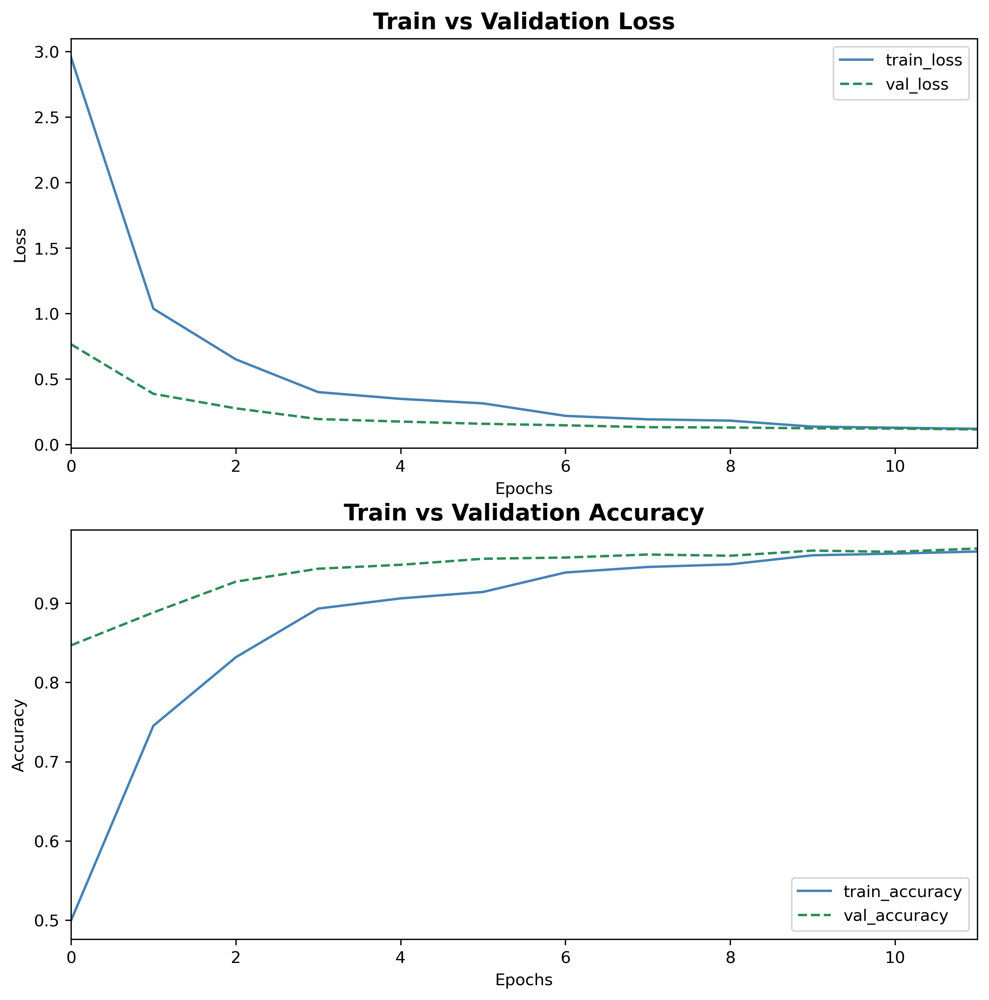

In [25]:
from matplotlib.ticker import MaxNLocator



fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10,10), dpi=300)
axes[0].plot(loss, label="train_loss", color="steelblue")
axes[0].plot(val_loss, label="val_loss", color="seagreen", linestyle="--")
axes[0].set_title("Train vs Validation Loss", fontsize=14, fontweight="bold")
axes[0].set_xlabel("Epochs")
axes[0].set_xlim((0,11))
axes[0].xaxis.set_major_locator(MaxNLocator(integer=True))
axes[0].set_ylabel("Loss")
axes[1].plot(acc, label="train_accuracy", color="steelblue")
axes[1].plot([float(i.cpu()) for i in val_acc], label="val_accuracy", color="seagreen", linestyle="--")
axes[1].set_title("Train vs Validation Accuracy", fontsize=14, fontweight="bold")
axes[1].set_xlabel("Epochs")
axes[1].set_xlim((0,11))
axes[1].xaxis.set_major_locator(MaxNLocator(integer=True))
axes[1].set_ylabel("Accuracy")
axes[0].legend(loc='best')
axes[1].legend(loc='best')
plt.show()

In [27]:
# learnable parameters of network
for name, param in model_resnet.named_parameters():
    if param.requires_grad == True:
        print(name, param.size(), param.requires_grad)

fc.0.weight torch.Size([525, 2048]) True
fc.0.bias torch.Size([525]) True


In [26]:
import copy

# сохранить веса нашей нейросети model
model_weights_best = copy.deepcopy(model_resnet.state_dict())
torch.save(model_weights_best, "birds/model_weights_50_best.pth")

In [30]:
torch.cuda.empty_cache()

In [34]:
# загружаем сохраненное состояние весов нейросети
model_resnet.load_state_dict(torch.load("birds/model_weights_50_best.pth"))

<All keys matched successfully>

In [24]:
label_encoder = pickle.load(open("label_encoder.pkl", 'rb'))

In [25]:
def predict_one_sample(model, inputs, device=DEVICE):
    '''Prediction for one picture'''
    with torch.no_grad():
        inputs = inputs.to(device)
        model.eval()
        logit = model(inputs).cpu()
        probs = torch.nn.functional.softmax(logit, dim=-1).numpy()
    return probs

In [28]:
def imshow(inp, title=None, plt_ax=plt, default=False):
    """Imshow для тензоров"""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt_ax.imshow(inp)
    if title is not None:
        plt_ax.set_title(title)
    plt_ax.grid(False)

In [40]:
random_characters = int(np.random.uniform(0, 1000))
ex_img, true_label = val_dataset[random_characters]
probs_im = predict_one_sample(model_resnet, ex_img.unsqueeze(0))

CERULEAN WARBLER 99.99997615814209
['CERULEAN WARBLER'] 99.99997615814209


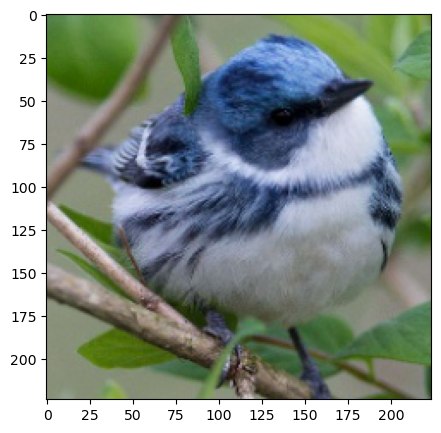

In [41]:
max_prob = probs_im.max() * 100
y_pred_argmax = np.argmax(probs_im, -1)
pred_class = label_encoder.classes_[y_pred_argmax]
if max_prob > 60:
    y_pred_argmax = np.argmax(probs_im, -1)
    pred_class = label_encoder.classes_[y_pred_argmax]
    print(pred_class[0], probs_im.max() * 100)
else:
    idx = np.argsort(probs_im[-1])[-3:][::-1]
    y_preds = [probs_im[-1][i] for i in idx]
    # actual_labels = label_encoder.classes_[val_dataset[random_characters][1]]
    for i, y_pred in zip(idx, y_preds):
        preds_class = label_encoder.classes_[i]
        print(preds_class, y_pred * 100)
print(pred_class, probs_im.max() * 100) # actual_labels
fig, ax = plt.subplots(figsize=(5,5))
imshow(ex_img, plt_ax=ax)

In [23]:
idxs = list(map(int, np.random.uniform(0, 1000, 20)))
imgs = [val_dataset[i][0].unsqueeze(0) for i in range(len(val_dataset))]

probs_ims = predict(model_resnet, imgs)

In [24]:
y_pred = np.argmax(probs_ims, -1)
actual_labels = [val_dataset[i][1] for i in range(len(val_dataset))]
preds_class = [label_encoder.classes_[i] for i in y_pred]

In [25]:
from sklearn.metrics import (precision_score, recall_score, f1_score, accuracy_score,
                             confusion_matrix, auc, roc_auc_score, classification_report)

In [26]:
from sklearn.metrics import f1_score, accuracy_score


f1_score_pic = f1_score(actual_labels, y_pred, average='macro')
acc_pic = accuracy_score(actual_labels, y_pred)
precision = precision_score(actual_labels, y_pred, average="macro")
recall = recall_score(actual_labels, y_pred, average="macro")
print(f"For all validation dataset:\nf1 score: {f1_score_pic}, accuracy: {acc_pic}, precision: {precision}, recall: {recall}")

For all validation dataset:
f1 score: 0.9687694739123309, accuracy: 0.9695238095238096, precision: 0.9743658352229783, recall: 0.9695238095238096


In [27]:
print(classification_report(actual_labels, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00         5
           3       1.00      1.00      1.00         5
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         5
           6       1.00      1.00      1.00         5
           7       1.00      1.00      1.00         5
           8       1.00      1.00      1.00         5
           9       1.00      1.00      1.00         5
          10       1.00      1.00      1.00         5
          11       1.00      1.00      1.00         5
          12       1.00      1.00      1.00         5
          13       0.83      1.00      0.91         5
          14       1.00      1.00      1.00         5
          15       0.83      1.00      0.91         5
          16       1.00      1.00      1.00         5
          17       0.80    

In [32]:
idxs = list(map(int, np.random.uniform(0, 1000, 20)))
imgs = [test_dataset[i][0].unsqueeze(0) for i in range(len(test_dataset))]

probs_ims = predict(model_resnet, imgs)

In [33]:
label_encoder = pickle.load(open("label_encoder.pkl", 'rb'))

In [34]:
y_pred = np.argmax(probs_ims, -1)
actual_labels = [test_dataset[i][1] for i in range(len(test_dataset))]
preds_class = [label_encoder.classes_[i] for i in y_pred]

In [35]:
from sklearn.metrics import f1_score, accuracy_score


f1_score_pic = f1_score(actual_labels, y_pred, average='macro')
acc_pic = accuracy_score(actual_labels, y_pred)
precision = precision_score(actual_labels, y_pred, average="macro")
recall = recall_score(actual_labels, y_pred, average="macro")
print(f"For all test dataset:\nf1 score = {f1_score_pic}, accuracy: {acc_pic}, precision: {precision}, recall: {recall}")

For all test dataset:
f1 score = 0.9809840635554922, accuracy: 0.9817142857142858, precision: 0.9847414965986395, recall: 0.9817142857142859


In [36]:
print(classification_report(actual_labels, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.80      0.89         5
           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00         5
           3       1.00      1.00      1.00         5
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         5
           6       1.00      1.00      1.00         5
           7       1.00      1.00      1.00         5
           8       1.00      1.00      1.00         5
           9       1.00      1.00      1.00         5
          10       1.00      1.00      1.00         5
          11       1.00      1.00      1.00         5
          12       1.00      1.00      1.00         5
          13       1.00      1.00      1.00         5
          14       1.00      1.00      1.00         5
          15       1.00      1.00      1.00         5
          16       1.00      1.00      1.00         5
          17       1.00    

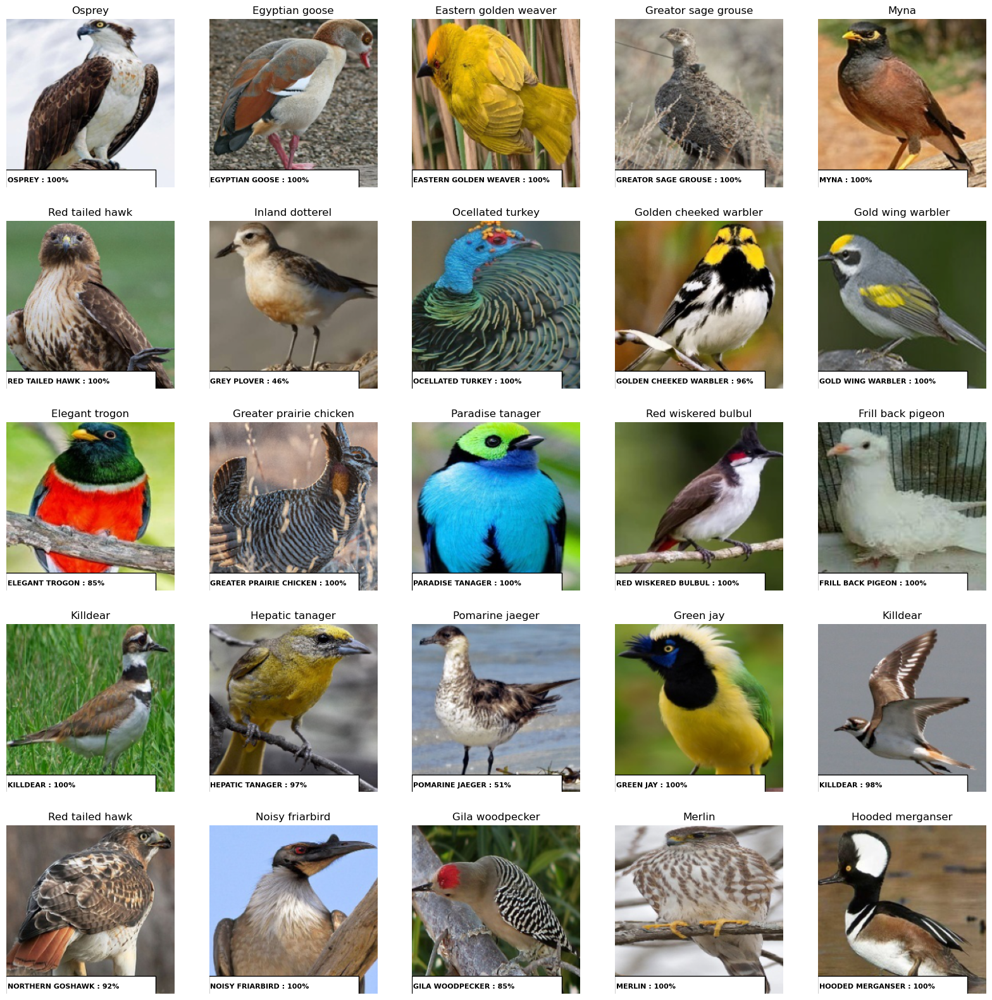

In [42]:
import matplotlib.patches as patches
from matplotlib.font_manager import FontProperties

fig, ax = plt.subplots(nrows=5, ncols=5, figsize=(20, 20))
for fig_x in ax.flatten():
    random_characters = int(np.random.uniform(1000, 2200))
    im_val, label = test_dataset[random_characters]
    img_label = " ".join(map(lambda x: x.capitalize(), 
                             test_dataset.label_encoder.inverse_transform([label])[0].split('_')))
    
    imshow(im_val.data.cpu(), title=img_label, plt_ax=fig_x)
    
    actual_text = "Actual: {}".format(img_label)
            
    fig_x.add_patch(patches.Rectangle((-1, 200), 200, 25, facecolor='white', edgecolor='black'))
    font0 = FontProperties()
    font = font0.copy()
    # font.set_family("Western")
    prob_pred = predict_one_sample(model_resnet, im_val.unsqueeze(0))
    predicted_proba = np.max(prob_pred) * 100
    y_pred = np.argmax(prob_pred)
    
    predicted_label = label_encoder.classes_[y_pred]
    # predicted_label = predicted_label[:len(predicted_label)//2] + '\n' + predicted_label[len(predicted_label)//2:]
    predicted_text = "{} : {:.0f}%".format(predicted_label, predicted_proba)
    
    fig_x.set_axis_off()
            
    fig_x.text(1, 210, predicted_text , horizontalalignment='left', fontproperties=font,
               verticalalignment='top', fontsize=8, color='black', fontweight='bold')

In [41]:
def predict_one_sample(model, inputs, device=DEVICE):
    '''Prediction for one picture'''
    with torch.no_grad():
        inputs = inputs.to(device)
        model.eval()
        logit = model(inputs).cpu()
        probs = torch.nn.functional.softmax(logit, dim=-1).numpy()
    return probs

In [85]:
# random_characters = int(np.random.uniform(0, 1000))
# ex_img, true_label = val_dataset[random_characters]
probs_im = predict_one_sample(model_resnet, a.unsqueeze(0))

AZURE TIT 99.99791383743286
['AZURE TIT'] 99.99791383743286
torch.Size([3, 224, 224])


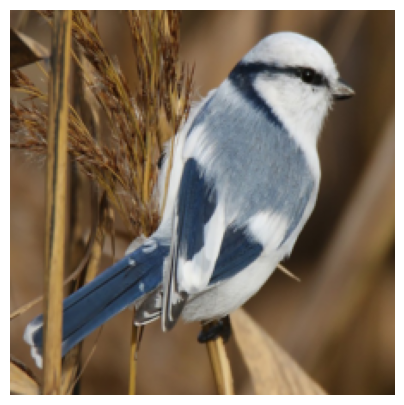

In [88]:
max_prob = probs_im.max() * 100
y_pred_argmax = np.argmax(probs_im, -1)
pred_class = label_encoder.classes_[y_pred_argmax]
if max_prob > 60:
    y_pred_argmax = np.argmax(probs_im, -1)
    pred_class = label_encoder.classes_[y_pred_argmax]
    print(pred_class[0], probs_im.max() * 100)
else:
    idx = np.argsort(probs_im[-1])[-3:][::-1]
    y_preds = [probs_im[-1][i] for i in idx]
    # actual_labels = label_encoder.classes_[val_dataset[random_characters][1]]
    for i, y_pred in zip(idx, y_preds):
        preds_class = label_encoder.classes_[i]
        print(preds_class, y_pred * 100)
print(pred_class, probs_im.max() * 100) # actual_labels


fig, ax = plt.subplots(figsize=(5,5))
prob_pred = predict_one_sample(model_resnet, a.unsqueeze(0))
predicted_proba = np.max(prob_pred) * 100
y_pred = np.argmax(prob_pred)
    
predicted_label = label_encoder.classes_[y_pred]
# predicted_label = predicted_label[:len(predicted_label)//2] + '\n' + predicted_label[len(predicted_label)//2:]
predicted_text = "{} : {:.0f}%".format(predicted_label, predicted_proba)
    
ax.set_axis_off()
            
# ax.add_patch(patches.Rectangle((-1, 200), 200, 25, facecolor='white', edgecolor='black'))
# ax.text(1, 210, predicted_text , horizontalalignment='left', fontproperties=font,
               # verticalalignment='top', fontsize=8, color='black', fontweight='bold')
imshow(a, plt_ax=ax)
ax.set_axis_off()

## Загружаем веса модели и предсказываем одну картинку

In [6]:
import pickle
import numpy as np

from PIL import Image
from pathlib import Path
from io import BytesIO

import torch
from torchvision import models
import torch.nn as nn
from torchvision import transforms

from matplotlib import colors, pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings(action='ignore', category=DeprecationWarning)
from torchvision import models
import matplotlib.patches as patches
from matplotlib.font_manager import FontProperties

import requests
import io


DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
RESCALE_SIZE = 232

In [19]:
model_resnet = models.resnet50(weights=None).to(DEVICE)
for i, child in enumerate(model_resnet.children()):
    if i not in [9]:
        for param in child.parameters():
            param.requires_grad = False

model_resnet.fc = nn.Sequential(nn.Linear(2048, 525))
model_resnet.load_state_dict(torch.load("birds/model_weights_50_best.pth"))
label_encoder = pickle.load(open("label_encoder.pkl", 'rb'))

In [3]:
def predict_image(model, image, device=DEVICE):
    model = model.to(device)
    transform = transforms.Compose([
                transforms.Resize(size=(RESCALE_SIZE,RESCALE_SIZE)),
                transforms.CenterCrop(size=224),
                transforms.ToTensor(),
                transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    
    response = requests.get(image).content
    image = Image.open(io.BytesIO(response)).convert("RGB")
    image_trans = transform(image).unsqueeze(0)
    
    with torch.no_grad():
        inputs = image_trans.to(device)
        model.eval()
        logit = model(inputs).cpu()
        probs = torch.nn.functional.softmax(logit, dim=-1).numpy()
        
    max_prob = probs.max() * 100
    y_pred_argmax = np.argmax(probs, -1)
    pred_class = label_encoder.classes_[y_pred_argmax]
    if max_prob > 60:
        y_pred_argmax = np.argmax(probs, -1)
        pred_class = label_encoder.classes_[y_pred_argmax]
        print(pred_class[0], probs.max() * 100)
    else:
        idx = np.argsort(probs[-1])[-3:][::-1]
        y_preds = [probs[-1][i] for i in idx]
        # actual_labels = label_encoder.classes_[val_dataset[random_characters][1]]
        for i, y_pred in zip(idx, y_preds):
            preds_class = label_encoder.classes_[i]
            print(preds_class, y_pred * 100)
    print(pred_class, probs.max() * 100) # actual_labels
    
    
    predicted_text = "{}: {:.0f}%".format(pred_class[0], max_prob)
    fig, ax = plt.subplots(figsize=(5,5))
    # ax.add_patch(patches.Rectangle((-1, 200), 200, 25, facecolor='white', edgecolor='black'))
    # ax.text(1, 210, predicted_text , horizontalalignment='left', verticalalignment='top', fontsize=8, color='black', fontweight='bold')
    ax.imshow(image)
    ax.set_title(predicted_text, fontsize=14, fontweight="bold")
    ax.set_axis_off()

In [4]:
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/5/5c/Rose_Ringed_Parrot.jpg/220px-Rose_Ringed_Parrot.jpg"
# url = "https://upload.wikimedia.org/wikipedia/commons/thumb/6/6d/Blue-and-Yellow-Macaw.jpg/800px-Blue-and-Yellow-Macaw.jpg"
# url = "https://encrypted-tbn0.gstatic.com/licensed-image?q=tbn:ANd9GcTP8QaJWaDypUUp7_4JyNgj5tUXLQVN55Nxn--470sK3eE1G_bjgW1d4QuFb1jbFfF75wGFeq8hGTHMdUo"
# url = "https://cdn.download.ams.birds.cornell.edu/api/v1/asset/126386161/1800"
# url = "https://upload.wikimedia.org/wikipedia/commons/f/f2/Snowy_Owl_-_Schnee-Eule.jpg"
# url = "https://encrypted-tbn3.gstatic.com/licensed-image?q=tbn:ANd9GcRFRrKBnz6feen977avyCZHezOudHz_OzvT5KmSvOAzj_nqqBmwDs7_DmkixiFjvewsrB9kIcFaa_CJ3NA"
# url = "https://ucnj.org/falcon-camera/wp-content/uploads/sites/36/2022/04/image-2.png"
# url = "https://encrypted-tbn0.gstatic.com/licensed-image?q=tbn:ANd9GcR40UICS-9g2Qhi_HJr_8EtTxM2C6xKepC2BS6fndGlqM1HddnUsSOn9Jc71n4usRXaf4UosMg9SHj3Cdk"
# url = "https://i.ytimg.com/vi/DPiH7xAfZzs/maxresdefault.jpg"
# url = "https://cdn.download.ams.birds.cornell.edu/api/v1/asset/144016211/1800"
# url = "https://www.allaboutbirds.org/guide/assets/photo/303618951-480px.jpg"
# url = "https://thumbs.dreamstime.com/b/australian-sulphur-crested-cockatoo-kakadu-27983555.jpg"
# url = "https://www.gannett-cdn.com/presto/2023/04/27/USAT/9e5ff064-73df-4980-9490-b8fe05dcfabb-041023_MM_Jennifer_Cunha_067.JPG?crop=1399,787,x0,y70&width=1399&height=699&format=pjpg&auto=webp"
# url = "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQeHVZIWVht83xXi2BloPD7A3SRlOdaSmgwpA9CJ-vJSnHhCGGuUjfjMAJisGLYvfR7BEA&usqp=CAU"
response = requests.get(url).content
im = Image.open(io.BytesIO(response)).convert('RGB')

ALEXANDRINE PARAKEET 99.99988079071045
['ALEXANDRINE PARAKEET'] 99.99988079071045


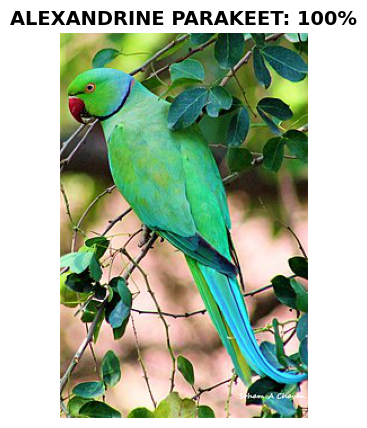

In [5]:
predict_image(model_resnet, url)